<a href="https://colab.research.google.com/github/aaubs/ds-master/blob/main/notebooks/M1-airbnb-eda-geoplot-class.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Installs
!pip install pydeck -q
!pip install folium -q

In [2]:
import numpy as np
import pandas as pd
import seaborn as sns #seaborn plots

# optinal
from matplotlib import pyplot as plt #plot control
sns.set() #plot style

#Geoplotting with folium/leaflet
import folium
from folium.plugins import MarkerCluster
from folium.plugins import HeatMap

#Fancy geoplotting with DeckGL
import pydeck as pdk

In [3]:
data = pd.read_csv('http://data.insideairbnb.com/denmark/hovedstaden/copenhagen/2022-06-24/visualisations/listings.csv')

In [30]:
#renaming a column for no reason

data.rename({'license':'License'}, axis=1, inplace=True)

In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12495 entries, 0 to 12494
Data columns (total 18 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              12495 non-null  int64  
 1   name                            12495 non-null  object 
 2   host_id                         12495 non-null  int64  
 3   host_name                       12494 non-null  object 
 4   neighbourhood_group             0 non-null      float64
 5   neighbourhood                   12495 non-null  object 
 6   latitude                        12495 non-null  float64
 7   longitude                       12495 non-null  float64
 8   room_type                       12495 non-null  object 
 9   price                           12495 non-null  int64  
 10  minimum_nights                  12495 non-null  int64  
 11  number_of_reviews               12495 non-null  int64  
 12  last_review                     

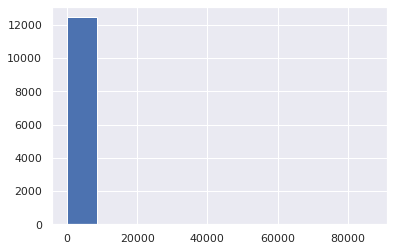

In [7]:
data.price.hist()

In [8]:
data = data[data.number_of_reviews > 0]

In [9]:
data.room_type.value_counts()

Entire home/apt    8899
Private room       1255
Hotel room           22
Shared room          15
Name: room_type, dtype: int64

In [10]:
data.room_type.unique()

array(['Entire home/apt', 'Private room', 'Shared room', 'Hotel room'],
      dtype=object)

In [11]:
data = data[data.room_type.isin(['Private room', 'Entire home/apt'])]

In [13]:
data.neighbourhood.value_counts()

Vesterbro-Kongens Enghave    1701
Nrrebro                      1652
Indre By                     1601
sterbro                      1068
Frederiksberg                1000
Amager Vest                   929
Amager st                     773
Bispebjerg                    492
Valby                         434
Vanlse                        265
Brnshj-Husum                  239
Name: neighbourhood, dtype: int64

In [14]:
palette=['#FF8C00','#A034F0', '#159090']

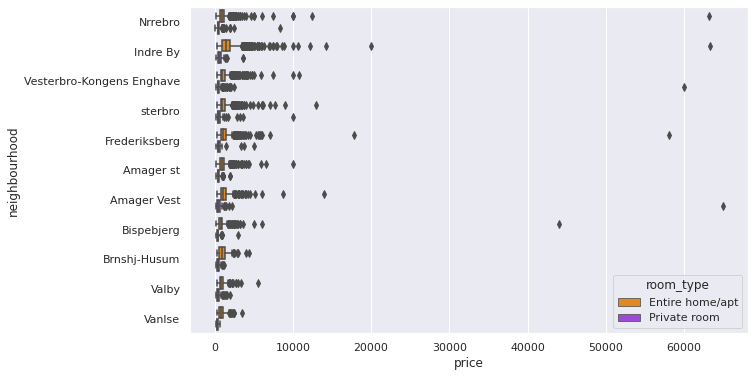

In [17]:
plt.figure(figsize=(10,6))

sns.boxplot(data = data, x = "price", y = "neighbourhood" , 
            hue = "room_type", palette=palette)

In [19]:
data['price'].mean()

1171.6613157376403

In [18]:
data['price_z'] = (data['price'] - data['price'].mean())/data['price'].std(ddof=0)

In [20]:
data['price_z'] = data['price_z'].abs()

In [22]:
data = data[data.price_z < 3]

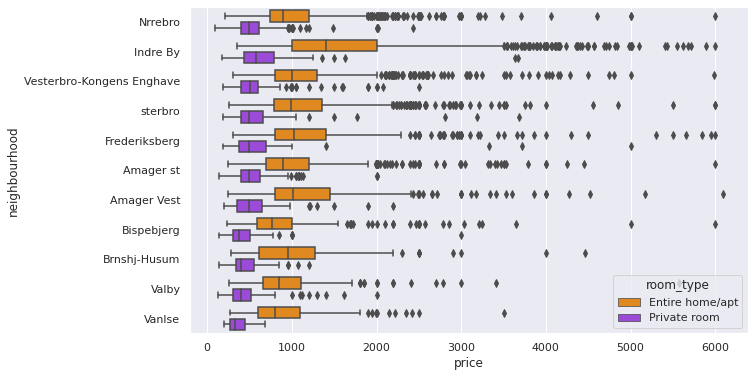

In [23]:
plt.figure(figsize=(10,6))

sns.boxplot(data = data, x = "price", y = "neighbourhood" , 
            hue = "room_type", palette=palette)

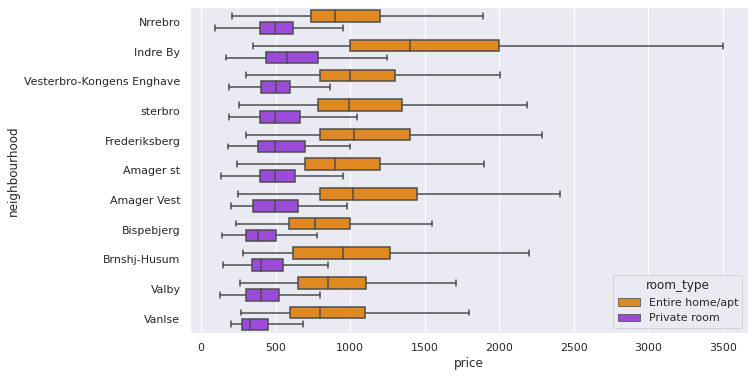

In [24]:
plt.figure(figsize=(10,6))

sns.boxplot(data = data, x = "price", y = "neighbourhood" , 
            hue = "room_type", palette=palette, showfliers=False)

In [25]:
data['log_price'] = np.log(data['price'])

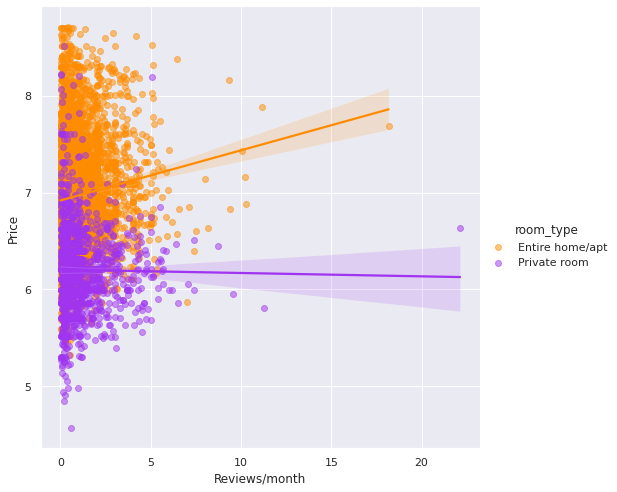

In [26]:
g = sns.lmplot(x="reviews_per_month",
               y="log_price",
               hue="room_type",
               height=7,
               data=data,
               scatter_kws={'alpha':0.5},
               palette=palette)
g.set_xlabels('Reviews/month')
g.set_ylabels('Price')

### Identifying commercial listings

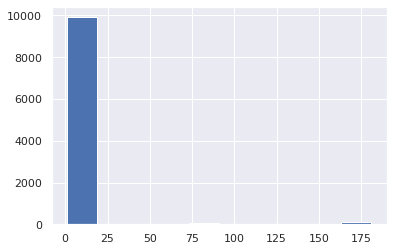

In [31]:
data['calculated_host_listings_count'].hist()

In [45]:
data['calculated_host_listings_count'].quantile(0.95)

4.0

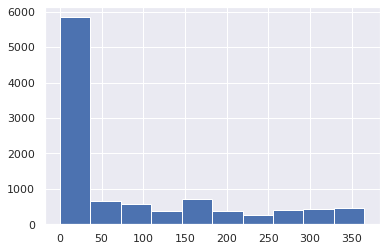

In [46]:
data['availability_365'].hist()

In [47]:
data['availability_365'].median()

18.0

In [50]:
data_cheaters = data[
                      (data['calculated_host_listings_count'] > data['calculated_host_listings_count'].quantile(0.95)) 
                    | (data['availability_365'] > 31) 
                    & (data['reviews_per_month'] > 3)
                    
                    ]

In [51]:
data_cheaters

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,License,price_z,log_price
2,26473,City Centre Townhouse Sleeps 1-10 persons,112210,Julia,NaN,Indre By,55.67602,12.575400,Entire home/apt,3350,3,293,2020-03-02,2.06,11,3,0,NaN,1.313179,8.116716
71,176963,Cosy private room close to center -next to Metro,846204,Vogelkop,NaN,Vesterbro-Kongens Enghave,55.66777,12.548440,Private room,360,1,433,2022-06-20,3.28,5,138,54,NaN,0.489298,5.886104
152,330915,Lovely room - in the heart of CPH!,799887,Bente,NaN,Vesterbro-Kongens Enghave,55.67365,12.555810,Private room,551,1,690,2022-06-04,5.52,3,33,47,NaN,0.374157,6.311735
206,894420,Wonderful apt. right in the city!,4761790,Henrik,NaN,Indre By,55.68009,12.579090,Entire home/apt,1507,2,402,2022-06-17,3.58,1,260,21,NaN,0.202154,7.317876
479,1534974,Your Best Choice in Copenhagen DK,1386103,Angelina,NaN,Amager st,55.65625,12.609710,Private room,1048,2,1,2013-09-22,0.01,6,365,0,NaN,0.074547,6.954639
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12338,42535244,housNear Copenhagen from 2 person up to 24 person,32329796,Rene,NaN,Brnshj-Husum,55.72102,12.470460,Entire home/apt,1610,2,1,2020-08-25,0.04,9,358,0,NaN,0.264246,7.383989
12359,597005610893680396,"Skøn ugenert lejlighed. Tæt på lufthavn, og st...",345381276,Anni,NaN,Amager st,55.63567,12.640560,Entire home/apt,770,3,4,2022-06-17,3.53,1,75,4,NaN,0.242136,6.646391
12370,559109977981575469,Hyggeligt anneks med adgang til have.,96936821,Toni,NaN,Bispebjerg,55.73329,12.517310,Entire home/apt,404,2,13,2022-06-21,3.12,1,243,13,NaN,0.462773,6.001415
12428,12386763,New guesthouse apartment 20 minutes from center,45712465,Hans Og Susanne,NaN,Brnshj-Husum,55.70412,12.448590,Entire home/apt,510,2,267,2022-06-22,3.83,1,290,14,NaN,0.398873,6.234411


In [52]:
data_cheaters.neighbourhood.value_counts()

Indre By                     306
Vesterbro-Kongens Enghave     71
Amager Vest                   67
Amager st                     59
Nrrebro                       43
sterbro                       40
Frederiksberg                 34
Valby                         24
Brnshj-Husum                  12
Bispebjerg                     9
Vanlse                         9
Name: neighbourhood, dtype: int64

In [55]:
data_cheaters.groupby('neighbourhood')['price'].mean()

neighbourhood
Amager Vest                  1025.865672
Amager st                     953.016949
Bispebjerg                    556.222222
Brnshj-Husum                 1444.833333
Frederiksberg                 948.176471
Indre By                     2030.852941
Nrrebro                      1209.627907
Valby                         750.333333
Vanlse                        584.666667
Vesterbro-Kongens Enghave    1060.704225
sterbro                      1300.925000
Name: price, dtype: float64

In [56]:
data.groupby('neighbourhood')['price'].mean()

neighbourhood
Amager Vest                  1083.031317
Amager st                     989.984436
Bispebjerg                    827.784114
Brnshj-Husum                  904.271967
Frederiksberg                1127.985958
Indre By                     1592.095208
Nrrebro                       974.679222
Valby                         872.884793
Vanlse                        824.615094
Vesterbro-Kongens Enghave    1065.225692
sterbro                      1098.355932
Name: price, dtype: float64

### Geoplotting intro

In [58]:
data_s = data.sample(1000)

In [67]:
#Define the map
map = folium.Map(location=[55.7300, 12.5400], zoom_start=12)

#add prettier base-layer
folium.TileLayer('cartodbpositron').add_to(map)

#add points (in a loop)
for j in data_s.iterrows():
    marker = folium.Circle(
        radius=30,
        location=[j[1]['latitude'], j[1]['longitude']],
        tooltip=j[1]['name'],
        popup=f"<b>{j[1]['name']}</b>\n {j[1]['price']}",
        color='purple',
        fill=True
    ).add_to(map)

#locations = zip(data['longitude'], data['latitude'])
#HeatMap(locations).add_to(map)

In [68]:
map

In [69]:
#Define the map
map = folium.Map(location=[55.7200, 12.5400], zoom_start=12)

#add prettier base-layer
folium.TileLayer('cartodbpositron').add_to(map)

#add points (in a loop)
for j in data_s.iterrows():
    marker= folium.Circle(
        radius=30,
        location=[j[1]['latitude'], j[1]['longitude']],
        tooltip=j[1]['name'],
        popup=f"<b>{j[1]['name']}</b>\n {j[1]['price']}",
        color='purple',
        fill=True
    ).add_to(map)

#adding heatmap layer
locations = zip(data_s['latitude'], data_s['longitude'])
HeatMap(locations).add_to(map)

In [70]:
map

In [75]:
data_s = data.sample(2000)

In [76]:
marker_cluster = MarkerCluster(
    name='CPH Airbnb',
    overlay=True,
    control=False,
    icon_create_function=None,
    showCoverageOnHover = False
)

In [77]:
#Define the map
map = folium.Map(location=[55.7800, 12.5400], zoom_start=12)

#add prettier base-layer
folium.TileLayer('cartodbpositron').add_to(map)

#add points (in a loop)
for j in data_s.iterrows(): # <--- using the whole dataset
    marker= folium.Circle(
        radius=30,
        location=[j[1]['latitude'], j[1]['longitude']],
        tooltip=j[1]['name'],
        popup=f"<b>{j[1]['name']}</b>\n {j[1]['price']}",
        color='purple',
        fill=True
    )
    marker_cluster.add_child(marker) # <<--- here we add the marker to the cluster rather than to the map directly

marker_cluster.add_to(map)

locations = zip(data_s['latitude'], data_s['longitude'])
HeatMap(locations).add_to(map)


In [78]:
map

In [79]:
map.save('cph_folium.html')

### Going fancier with Deck GL

In [80]:
# Define a layer to display on a map

layer = pdk.Layer(
    "HexagonLayer",
    data,
    get_position=["longitude", "latitude"],
    auto_highlight=True,
    elevation_scale=50,
    pickable=True,
    radius=50,
    opacity=0.3,
    elevation_range=[0, 200],
    extruded=True,
    coverage=1,
)

# Set the viewport location
view_state = pdk.ViewState(latitude=data['latitude'].mean(), longitude=data['longitude'].mean(), zoom=11, min_zoom=5, max_zoom=15, pitch=40.5, bearing=-27.36)

# Render
r = pdk.Deck(layers=[layer], initial_view_state=view_state, tooltip={"text": "{elevationValue}"})

In [81]:
r.to_html(r'airbnb_hexa.html')

<IPython.core.display.Javascript object>

'<!DOCTYPE html>\n<html>\n  <head>\n    <meta http-equiv="content-type" content="text/html; charset=UTF-8" />\n    <title>pydeck</title>\n        <script src="https://api.tiles.mapbox.com/mapbox-gl-js/v1.13.0/mapbox-gl.js"></script>\n        <link rel="stylesheet" href="https://maxcdn.bootstrapcdn.com/bootstrap/3.2.0/css/bootstrap-theme.min.css" />\n    <link rel="stylesheet" href="https://maxcdn.bootstrapcdn.com/font-awesome/4.6.3/css/font-awesome.min.css" />\n    <script src=\'https://cdn.jsdelivr.net/npm/@deck.gl/jupyter-widget@~8.5.*/dist/index.js\'></script>\n    <style>\n    body {\n  margin: 0;\n  padding: 0;\n  overflow: hidden;\n}\n\n#deck-map-container {\n  width: 100%;\n  height: 100%;\n  background-color: black;\n}\n\n#map {\n  pointer-events: none;\n  height: 100%;\n  width: 100%;\n  position: absolute;\n  z-index: 1;\n}\n\n#deckgl-overlay {\n  z-index: 2;\n  background: none;\n}\n\n#deck-map-wrapper {\n  width: 100%;\n  height: 100%;\n}\n\n#deck-container {\n  width: 100v